Making $\beta$ time dependend s.t. the energy $E=x^2+y^2+z^2$ is constant

In [1]:
include("UsefulFunctions.jl")
include("lorentz_system.jl")
include("/Users/00eila01/01_Arbete/UTBILDNING/KEXET/Numerical-Solutions-and-Parameter-Sensitivity-of-the-Lorentz-System-Degree-Project-in-Technology/Numerical-Solvers/Solvers.jl")
include("Energy_conserving_parameters.jl")

Mu (generic function with 1 method)

In [30]:
function P(x)
    return [θ, μ, Beta(x, θ, μ)]
end

P (generic function with 1 method)

In [33]:
function P(x)
    return [θ, μ, 0]
end

P (generic function with 1 method)

In [21]:
# initial conditions
x = [100; 
     10; 
     100]
θ = 0.10; μ = -0.1; β = Beta(x,θ,μ);
t = 5
Δt = 0.0001

0.0001

In [5]:
# Finds the energy at each step of the trajectory for starting position x̄₀
function Energy_of_Path(ẋ::Function, Δt, tim, x̄₀, p)
    tsteps = Int(tim/Δt)
    x̄=x̄₀
    Energy = zeros(tsteps)
    for i=1:tsteps
        x̄= ẋ(p(x̄),x̄,Δt)
        Energy[i] = EnergyFunction(x̄)
    end
    return Energy
end

Energy_of_Path (generic function with 1 method)

In [6]:
function Track_Beta(ẋ::Function, Δt, tim, x̄₀, p)
    tsteps = Int(tim/Δt)
    x̄=x̄₀
    betas = zeros(tsteps)
    for i=1:tsteps
        x̄= ẋ(p(x̄),x̄,Δt)
        betas[i] = Beta(x̄,θ,μ)
    end
    return betas
end

Track_Beta (generic function with 1 method)

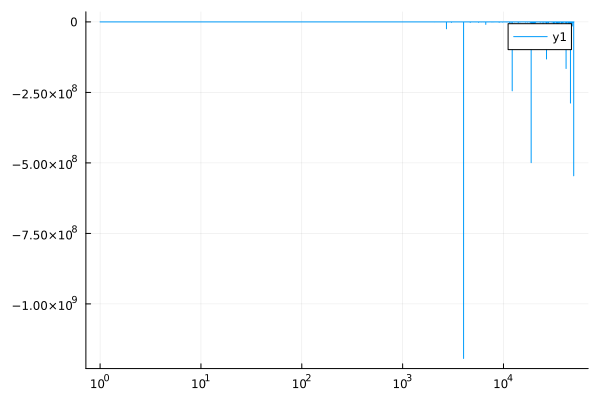

In [27]:
betas = Track_Beta(RK4, Δt, t, x, P)
plot(betas,xaxis=:log10)

In [7]:
function Plot_Energies_Fixp(ẋ,initial_vals, time, Δt,p)
    Energies = zeros(length(initial_vals[1,:]), Int(time/Δt))
    i=1

    plt=plot(
        xlim = (0,time),
        title="Plot of the Energy $ẋ \n Δt=$Δt",
        xlabel="time",
        ylabel="Energy",
        palette = :seaborn_dark6,
        dpi = 300,
        linewidth = 4
    )

    for x̄₀ in eachcol(initial_vals)
        Energies[i,:] = Energy_of_Path(ẋ, Δt, time, x̄₀, p)
        plot!(plt,range(0,stop=time-Δt,step=Δt),Energies[i,:], label=string([round(x̄₀[1]),round(x̄₀[2]),round(x̄₀[3])]))
        i+=1
    end
    display(plt)
end

Plot_Energies_Fixp (generic function with 1 method)

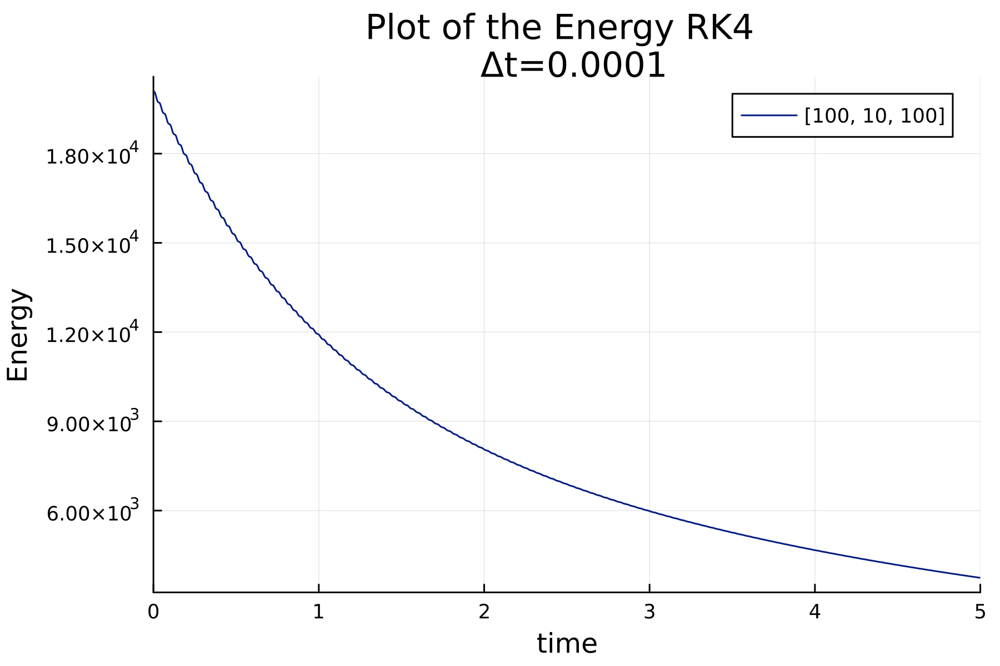

In [26]:
Plot_Energies_Fixp(RK4,x, t, Δt, P)

In [36]:
Δt_RK = Δt
tsteps_RK = Int(20/Δt_RK)
x̄=x
XRK = zeros(3,tsteps_RK)
for i=1:tsteps_RK
    x̄=RK4(P(x̄),x̄,Δt_RK)
    XRK[:,i] = x̄
end

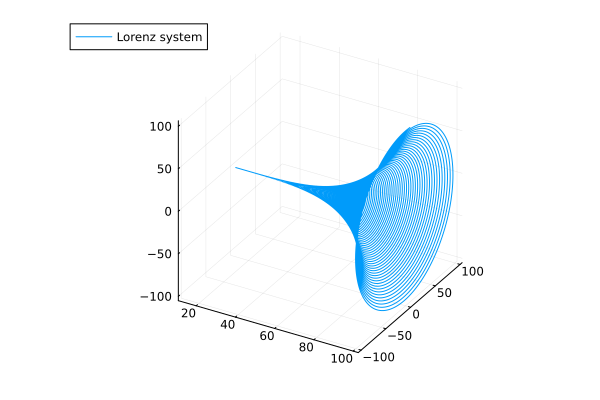

In [37]:
plot(XRK[1,:],XRK[2,:],XRK[3,:],label="Lorenz system")